In [1]:
import pandas as pd

# Path to your Excel file
file_path = r'C:\Users\steph\Downloads\EFFIS_All_Fires_Compiled_all.xlsx'

# Read the Excel file
df = pd.read_excel(file_path)

# Print all column names so you can identify the exact ones
print("Columns in the file:")
print(df.columns.tolist())

# UPDATE THESE WITH THE EXACT COLUMN NAMES FROM THE OUTPUT ABOVE
lat_col = 'Lat'      # e.g., 'latitude', 'LAT', 'Latitude'
lon_col = 'Lon'      # e.g., 'longitude', 'LON', 'Longitude'
date_col = 'Date'    # e.g., 'date', 'FIRE_DATE', 'Date '

# Extract only the three columns
extracted_df = df[[lat_col, lon_col, date_col]].copy()

# Drop rows with any missing values
extracted_df = extracted_df.dropna()

# Convert Date to proper datetime (handles various formats)
extracted_df[date_col] = pd.to_datetime(extracted_df[date_col], errors='coerce')

# No file output, no previews printed
print(f"Done! Loaded and cleaned {len(extracted_df)} rows into 'extracted_df'.")
print("You can now use the DataFrame in your script, e.g., extracted_df.head()")

Columns in the file:
['Source File', 'Fire ID', 'Date', 'Updated', 'Country', 'Lon', 'Lat', 'Area (ha)', 'Perimeter (km)', 'Built-up Inside (m²)', 'Built-up Buffer (m²)', 'Population Inside', 'Population Buffer', 'Population 5km', 'Pop Density 5km (pop/km²)', 'Forest (ha)', 'Agricultural (ha)', 'Other Natural (ha)', 'Natura2000 (%)', 'Natura2000 (ha)']
Done! Loaded and cleaned 5 rows into 'extracted_df'.
You can now use the DataFrame in your script, e.g., extracted_df.head()


In [2]:
import pystac_client
import planetary_computer
import pandas as pd
from datetime import datetime, timedelta
import os
import json
import warnings
import math
import rasterio
from rasterio.warp import reproject, Resampling
import numpy as np
from pyproj import Transformer
from rasterio.windows import Window

# Suppress noisy deprecation warning
warnings.filterwarnings(
    "ignore",
    category=FutureWarning,
    message=r"get_items\(\) is deprecated"
)

# Configuration
SQUARE_SIZE_KM = 20
OUTPUT_DIR = r'C:\Users\steph\Downloads\master_thesis\scripts\sentinel2_fire_images\preview'
os.makedirs(OUTPUT_DIR, exist_ok=True)
MAX_SEARCH_DAYS = 30  # Maximum days to search beyond the 5-day minimum

# Sentinel-2 band information - all available bands for land cover classification
SENTINEL2_BANDS = {
    # 10m resolution bands
    "B02": {"name": "Blue", "resolution": 10, "wavelength": "490nm"},
    "B03": {"name": "Green", "resolution": 10, "wavelength": "560nm"},
    "B04": {"name": "Red", "resolution": 10, "wavelength": "665nm"},
    "B08": {"name": "NIR", "resolution": 10, "wavelength": "842nm"},
    
    # 20m resolution bands
    "B05": {"name": "Red Edge 1", "resolution": 20, "wavelength": "705nm"},
    "B06": {"name": "Red Edge 2", "resolution": 20, "wavelength": "740nm"},
    "B07": {"name": "Red Edge 3", "resolution": 20, "wavelength": "783nm"},
    "B8A": {"name": "Red Edge 4", "resolution": 20, "wavelength": "865nm"},
    "B11": {"name": "SWIR 1", "resolution": 20, "wavelength": "1610nm"},
    "B12": {"name": "SWIR 2", "resolution": 20, "wavelength": "2190nm"},
    
    # 60m resolution bands
    "B01": {"name": "Coastal Aerosol", "resolution": 60, "wavelength": "443nm"},
    "B09": {"name": "Water Vapor", "resolution": 60, "wavelength": "945nm"},
    "B10": {"name": "Cirrus", "resolution": 60, "wavelength": "1375nm"},
    
    # Classification bands
    "SCL": {"name": "Scene Classification", "resolution": 20, "wavelength": "N/A"},
    "AOT": {"name": "Aerosol Optical Thickness", "resolution": 20, "wavelength": "N/A"},
    "WVP": {"name": "Water Vapor", "resolution": 20, "wavelength": "N/A"}
}

# Priority bands for land cover classification (in order of importance)
PRIORITY_BANDS = ["B02", "B03", "B04", "B08", "B11", "B12", "B05", "B06", "B07", "B8A", "SCL"]

def create_square_bbox(lat: float, lon: float, size_km: float = SQUARE_SIZE_KM):
    """Return (min_lon, min_lat, max_lon, max_lat) for a square area with given side length."""
    R = 6371.0  # Earth radius (km)
    
    # Calculate latitude bounds
    lat_offset = (size_km / 2) / R * (180 / math.pi)
    min_lat = lat - lat_offset
    max_lat = lat + lat_offset
    
    # Calculate longitude bounds (accounts for latitude)
    lon_offset = (size_km / 2) / (R * math.cos(math.radians(lat))) * (180 / math.pi)
    min_lon = lon - lon_offset
    max_lon = lon + lon_offset
    
    return (min_lon, min_lat, max_lon, max_lat)

def point_in_granule(item, lat: float, lon: float):
    """Check if the fire point is within the granule's footprint."""
    try:
        geometry = item.geometry
        if geometry and geometry['type'] == 'Polygon':
            from shapely.geometry import Point, shape
            point = Point(lon, lat)
            granule_poly = shape(geometry)
            return granule_poly.contains(point)
        return True
    except ImportError:
        print("  Warning: shapely not available, skipping geometry check")
        return True
    except Exception as e:
        print(f"  Warning: geometry check failed: {e}")
        return True

def get_available_bands(item):
    """Get list of available bands in the STAC item."""
    available_bands = []
    for band_key in item.assets:
        if any(standard_band in band_key for standard_band in SENTINEL2_BANDS.keys()):
            available_bands.append(band_key)
    
    # Sort by priority
    available_bands_sorted = []
    for priority_band in PRIORITY_BANDS:
        if priority_band in available_bands:
            available_bands_sorted.append(priority_band)
    
    # Add any remaining bands
    for band in available_bands:
        if band not in available_bands_sorted:
            available_bands_sorted.append(band)
    
    return available_bands_sorted

def calculate_square_cloud_cover(item, center_lat, center_lon):
    """Calculate cloud cover percentage specifically within the 20km square area."""
    try:
        # Calculate the bounding box for the 20km square
        bbox = create_square_bbox(center_lat, center_lon)
        min_lon, min_lat, max_lon, max_lat = bbox
        
        # Get the signed URL for the Scene Classification Layer (SCL)
        scl_asset_key = "SCL"
        if scl_asset_key not in item.assets:
            print("    → No SCL band found, using granule cloud cover")
            return item.properties.get("eo:cloud_cover", 100)
        
        signed_url = planetary_computer.sign(item.assets[scl_asset_key].href)
        
        with rasterio.open(signed_url) as src:
            # Transform geographic coordinates to pixel coordinates
            transformer = Transformer.from_crs("EPSG:4326", src.crs, always_xy=True)
            
            # Transform bounds to image CRS
            min_x, min_y = transformer.transform(min_lon, min_lat)
            max_x, max_y = transformer.transform(max_lon, max_lat)
            
            # Get pixel coordinates of the bounds
            row_min, col_min = src.index(min_x, max_y)
            row_max, col_max = src.index(max_x, min_y)
            
            # Ensure we're within image bounds
            height, width = src.shape
            row_min = max(0, row_min)
            row_max = min(height - 1, row_max)
            col_min = max(0, col_min)
            col_max = min(width - 1, col_max)
            
            # Check if square is entirely within image
            if (row_max - row_min <= 0) or (col_max - col_min <= 0):
                print("    → Square not entirely within image bounds")
                return 100
            
            # Calculate window for extraction
            window = Window(col_min, row_min, col_max - col_min, row_max - row_min)
            
            # Read SCL data through the window
            scl_data = src.read(1, window=window)
            
            # SCL classification: 3=cloud shadow, 8=medium cloud, 9=high cloud, 10=thin cirrus
            cloud_classes = [3, 8, 9, 10]
            cloud_pixels = np.sum(np.isin(scl_data, cloud_classes))
            total_pixels = scl_data.size
            
            cloud_percentage = (cloud_pixels / total_pixels) * 100 if total_pixels > 0 else 100
            
            print(f"    → Square cloud cover: {cloud_percentage:.1f}%")
            return cloud_percentage
            
    except Exception as e:
        print(f"    → Error calculating square cloud cover: {e}")
        return item.properties.get("eo:cloud_cover", 100)

def find_best_image(catalog, bbox, fire_date, center_lat, center_lon, search_type="before"):
    """
    Find the best image that meets all criteria:
    - At least 5 days from fire date
    - Square entirely within image
    - Cloud cover < 10% in square
    - Prefer dates closer to 5 days
    """
    best_item = None
    best_days_diff = float('inf')
    
    # Search strategy: Start from minimum 5 days and go outward
    # This ensures we get at least 5 days but prefer closer to 5
    for days_from_minimum in range(0, MAX_SEARCH_DAYS + 1):
        if search_type == "before":
            days_diff = 5 + days_from_minimum
            target_date = fire_date - timedelta(days=days_diff)
        else:  # after
            days_diff = 5 + days_from_minimum
            target_date = fire_date + timedelta(days=days_diff)
        
        # If we already found something closer than this, stop searching
        if days_diff > best_days_diff:
            break
            
        print(f"  Checking {search_type} {days_diff} day(s): {target_date.date()}")
        
        try:
            # Search with reasonable cloud filter
            search = catalog.search(
                collections=["sentinel-2-l2a"],
                bbox=bbox,
                datetime=f"{target_date.strftime('%Y-%m-%d')}/{target_date.strftime('%Y-%m-%d')}",
                query={"eo:cloud_cover": {"lt": 50}},  # Reasonable initial filter
            )
            items = list(search.items())
            
            if items:
                # Check items that contain our point
                valid_items = [item for item in items if point_in_granule(item, center_lat, center_lon)]
                
                if valid_items:
                    # Sort by cloud cover to check least cloudy first
                    sorted_items = sorted(valid_items, key=lambda i: i.properties.get("eo:cloud_cover", 100))
                    
                    for item in sorted_items[:3]:  # Check top 3 least cloudy
                        # Verify square cloud cover
                        square_cloud = calculate_square_cloud_cover(item, center_lat, center_lon)
                        
                        if square_cloud < 10:  # Our main criteria
                            best_item = item
                            best_days_diff = days_diff
                            print(f"    ✓ Found perfect match ({days_diff} days, {square_cloud:.1f}% clouds)")
                            return best_item, best_days_diff
                        else:
                            print(f"    → Square cloud cover {square_cloud:.1f}% > 10%, skipping")
                            
        except Exception as e:
            print(f"    → Search error: {e}")
    
    # If we didn't find anything with <10% clouds, try to find the best available
    if best_item is None:
        print(f"  No images with <10% square cloud cover found, searching for best available...")
        for days_from_minimum in range(0, MAX_SEARCH_DAYS + 1):
            if search_type == "before":
                days_diff = 5 + days_from_minimum
                target_date = fire_date - timedelta(days=days_diff)
            else:
                days_diff = 5 + days_from_minimum
                target_date = fire_date + timedelta(days=days_diff)
                
            try:
                search = catalog.search(
                    collections=["sentinel-2-l2a"],
                    bbox=bbox,
                    datetime=f"{target_date.strftime('%Y-%m-%d')}/{target_date.strftime('%Y-%m-%d')}",
                    query={"eo:cloud_cover": {"lt": 100}},
                )
                items = list(search.items())
                
                if items:
                    valid_items = [item for item in items if point_in_granule(item, center_lat, center_lon)]
                    if valid_items:
                        # Find the one with lowest square cloud cover
                        best_candidate = None
                        lowest_cloud = 100
                        
                        for item in valid_items[:5]:  # Check first 5
                            square_cloud = calculate_square_cloud_cover(item, center_lat, center_lon)
                            if square_cloud < lowest_cloud:
                                lowest_cloud = square_cloud
                                best_candidate = item
                                best_days_diff = days_diff
                        
                        if best_candidate:
                            best_item = best_candidate
                            print(f"    → Best available: {days_diff} days, {lowest_cloud:.1f}% clouds")
                            return best_item, best_days_diff
                            
            except Exception as e:
                print(f"    → Search error: {e}")
    
    return best_item, best_days_diff

def create_preview_metadata(item, output_path, center_lat, center_lon, days_diff, search_type):
    """Create preview metadata file without downloading the image."""
    try:
        # Get available bands
        available_bands = get_available_bands(item)
        
        # Calculate square cloud cover
        square_cloud = calculate_square_cloud_cover(item, center_lat, center_lon)
        
        # Create preview metadata
        metadata = {
            "preview_mode": True,
            "filename_preview": f"{search_type}_{output_path.split('_')[1]}_{item.datetime.strftime('%Y%m%d') if item.datetime else 'unknown'}_all_bands.tif",
            "item_id": item.id,
            "acquisition_date": item.datetime.isoformat() if item.datetime else None,
            "days_difference": days_diff,
            "image_type": search_type,
            "cloud_cover": {
                "granule": item.properties.get("eo:cloud_cover", "N/A"),
                "square_20km": square_cloud
            },
            "center_coordinates": {
                "latitude": center_lat,
                "longitude": center_lon
            },
            "search_area_km": SQUARE_SIZE_KM,
            "properties": {
                "platform": item.properties.get("platform", "N/A"),
                "constellation": item.properties.get("constellation", "N/A"),
                "processing_level": item.properties.get("processing:level", "N/A"),
            },
            "bands_available": available_bands,
            "band_count": len(available_bands),
            "download_info": {
                "status": "PREVIEW_ONLY",
                "message": "Image meets criteria - download commented out for preview",
                "stac_url": f"https://planetarycomputer.microsoft.com/api/stac/v1/collections/sentinel-2-l2a/items/{item.id}",
                "file_would_be_saved_as": f"{search_type}_{output_path.split('_')[1]}_{item.datetime.strftime('%Y%m%d') if item.datetime else 'unknown'}_all_bands.tif"
            },
            "band_details": {}
        }
        
        # Add band details
        for band_key in available_bands:
            band_info = SENTINEL2_BANDS.get(band_key, {"name": band_key, "resolution": "unknown", "wavelength": "unknown"})
            metadata["band_details"][band_key] = band_info
        
        # Save metadata
        with open(output_path, 'w') as f:
            json.dump(metadata, f, indent=2)
        
        print(f"  → PREVIEW: Would download {len(available_bands)} bands as: {metadata['filename_preview']}")
        print(f"  → Square cloud cover: {square_cloud:.1f}%")
        print(f"  → STAC Item: {item.id}")
        
        return metadata
        
    except Exception as e:
        print(f"  → Error creating preview metadata: {e}")
        return None

# Main processing
print("PREVIEW MODE: Searching for suitable Sentinel-2 images")
print("DOWNLOAD FUNCTIONS ARE COMMENTED OUT - PREVIEW ONLY")
print("Criteria:")
print("  - Before image: ≥5 days before fire (closer to 5 preferred)")
print("  - After image: ≥5 days after fire (closer to 5 preferred)") 
print("  - Square (20km) entirely within image")
print("  - Cloud cover < 10% in square area")
print("=" * 70)

# Connect to STAC catalog
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

successes = []

for idx, row in extracted_df.iterrows():
    lat = row[lat_col]
    lon = row[lon_col]
    date = row[date_col]
    
    print(f"\n{'='*50}")
    print(f"Fire {idx+1}/{len(extracted_df)} | ({lat:.5f}, {lon:.5f}) | {date.date()}")
    
    # Create search bbox
    bbox = create_square_bbox(lat, lon)
    print(f"  Search area: {SQUARE_SIZE_KM}km square centered on fire")
    
    # Find before image (≥5 days before, closer to 5 preferred)
    print("  Searching for BEFORE image (≥5 days before)...")
    before_item, before_days_diff = find_best_image(catalog, bbox, date, lat, lon, search_type="before")
    
    if before_item:
        before_date = before_item.datetime.strftime("%Y%m%d")
        
        # Create preview metadata ONLY - no download
        metadata_path = os.path.join(OUTPUT_DIR, f"preview_before_{idx+1:03d}_{before_date}.json")
        metadata = create_preview_metadata(before_item, metadata_path, lat, lon, before_days_diff, "before")
        
        if metadata:
            successes.append({
                "type": "before", 
                "fire_id": idx, 
                "preview_path": metadata_path,
                "item_id": before_item.id,
                "days_difference": before_days_diff,
                "acquisition_date": before_item.datetime.isoformat() if before_item.datetime else None,
                "granule_cloud_cover": before_item.properties.get("eo:cloud_cover", "N/A"),
                "square_cloud_cover": metadata["cloud_cover"]["square_20km"],
                "bands_available": metadata["bands_available"],
                "band_count": len(metadata["bands_available"]),
                "download_status": "PREVIEW_ONLY",
                "would_be_saved_as": metadata["filename_preview"]
            })
            print(f"  ✓ PREVIEW: Suitable before image found {before_days_diff} days before fire")
            
    else:
        print("  ✗ No suitable before image found")
    
    # Find after image (≥5 days after, closer to 5 preferred)
    print("  Searching for AFTER image (≥5 days after)...")
    after_item, after_days_diff = find_best_image(catalog, bbox, date, lat, lon, search_type="after")
    
    if after_item:
        after_date = after_item.datetime.strftime("%Y%m%d")
        
        # Create preview metadata ONLY - no download
        metadata_path = os.path.join(OUTPUT_DIR, f"preview_after_{idx+1:03d}_{after_date}.json")
        metadata = create_preview_metadata(after_item, metadata_path, lat, lon, after_days_diff, "after")
        
        if metadata:
            successes.append({
                "type": "after", 
                "fire_id": idx, 
                "preview_path": metadata_path,
                "item_id": after_item.id,
                "days_difference": after_days_diff,
                "acquisition_date": after_item.datetime.isoformat() if after_item.datetime else None,
                "granule_cloud_cover": after_item.properties.get("eo:cloud_cover", "N/A"),
                "square_cloud_cover": metadata["cloud_cover"]["square_20km"],
                "bands_available": metadata["bands_available"],
                "band_count": len(metadata["bands_available"]),
                "download_status": "PREVIEW_ONLY",
                "would_be_saved_as": metadata["filename_preview"]
            })
            print(f"  ✓ PREVIEW: Suitable after image found {after_days_diff} days after fire")
            
    else:
        print("  ✗ No suitable after image found")

print(f"\n{'='*70}")
print(f"PREVIEW COMPLETED! Found {len(successes)} suitable images")
print(f"Preview metadata files created in: {OUTPUT_DIR}")
print("NOTE: No actual image files were downloaded - PREVIEW MODE ONLY")
print("To enable downloads, uncomment the save_all_bands_geotiff() function calls")

# Print detailed summary
if successes:
    before_images = [s for s in successes if s["type"] == "before"]
    after_images = [s for s in successes if s["type"] == "after"]
    
    print(f"\nPREVIEW SUMMARY:")
    print(f"Total suitable images found: {len(successes)}")
    print(f"Preview metadata files created: {len(successes)}")
    
    # Band statistics
    all_bands = []
    for success in successes:
        all_bands.extend(success["bands_available"])
    unique_bands = set(all_bands)
    
    print(f"\nBand availability in suitable images:")
    print(f"  Unique bands available: {len(unique_bands)}")
    print(f"  Bands: {', '.join(sorted(unique_bands))}")
    
    if before_images:
        avg_before = sum(s["days_difference"] for s in before_images) / len(before_images)
        avg_bands = sum(s["band_count"] for s in before_images) / len(before_images)
        avg_cloud = sum(s["square_cloud_cover"] for s in before_images) / len(before_images)
        
        print(f"\nBefore images: {len(before_images)}")
        print(f"  Avg days from fire: {avg_before:.1f}")
        print(f"  Avg bands available: {avg_bands:.1f}")
        print(f"  Avg square cloud cover: {avg_cloud:.1f}%")
    
    if after_images:
        avg_after = sum(s["days_difference"] for s in after_images) / len(after_images)
        avg_bands = sum(s["band_count"] for s in after_images) / len(after_images)
        avg_cloud = sum(s["square_cloud_cover"] for s in after_images) / len(after_images)
        
        print(f"\nAfter images: {len(after_images)}")
        print(f"  Avg days from fire: {avg_after:.1f}")
        print(f"  Avg bands available: {avg_bands:.1f}")
        print(f"  Avg square cloud cover: {avg_cloud:.1f}%")
    
    # Save preview results
    results_df = pd.DataFrame(successes)
    results_csv = os.path.join(OUTPUT_DIR, 'preview_search_results.csv')
    results_df.to_csv(results_csv, index=False)
    print(f"\nPreview results saved to: {results_csv}")
    
    # List created preview files
    print(f"\nCreated preview files:")
    preview_files = [f for f in os.listdir(OUTPUT_DIR) if f.startswith('preview_') and f.endswith('.json')]
    for file in sorted(preview_files):
        print(f"  📄 {file}")
    
    print(f"\nTo download these images, uncomment the save_all_bands_geotiff() function calls")
    print(f"in the script and run again.")

PREVIEW MODE: Searching for suitable Sentinel-2 images
DOWNLOAD FUNCTIONS ARE COMMENTED OUT - PREVIEW ONLY
Criteria:
  - Before image: ≥5 days before fire (closer to 5 preferred)
  - After image: ≥5 days after fire (closer to 5 preferred)
  - Square (20km) entirely within image
  - Cloud cover < 10% in square area

Fire 1/5 | (41.96722, 25.38958) | 2023-07-27
  Search area: 20km square centered on fire
  Searching for BEFORE image (≥5 days before)...
  Checking before 5 day(s): 2023-07-22
  Checking before 6 day(s): 2023-07-21
  Checking before 7 day(s): 2023-07-20
  Checking before 8 day(s): 2023-07-19
    → Square cloud cover: 1.4%
    ✓ Found perfect match (8 days, 1.4% clouds)
    → Square cloud cover: 1.4%
  → PREVIEW: Would download 15 bands as: before_thesis\scripts\sentinel2_20230719_all_bands.tif
  → Square cloud cover: 1.4%
  → STAC Item: S2B_MSIL2A_20230719T090559_R050_T35TLG_20230719T131757
  ✓ PREVIEW: Suitable before image found 8 days before fire
  Searching for AFTER im

Extracting 10km Squares from Sentinel-2 Images with ALL BANDS
CHECKING FOR EXISTING FILES - WILL ONLY DOWNLOAD IF NEEDED
Found 10 preview files
Found 5 unique fire locations

Processing Fire Location 001

📤 Processing BEFORE image: preview_before_001_20230719.json
  📁 File already exists: square_10km_allbands_before_001_20230719.tif (14.9 MB)
  ✅ Valid file with 15 bands
  Image has 15 bands: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP']
  ✅ Added scale bar: 2 km


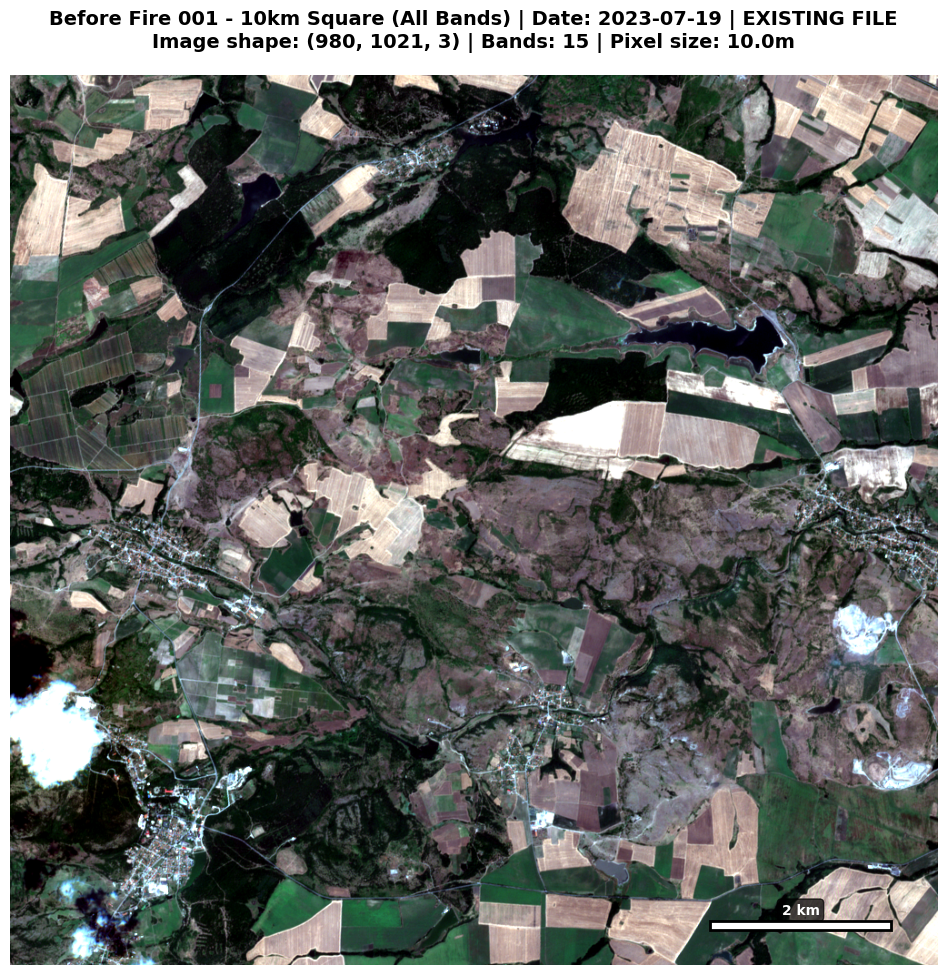

✅ Displayed RGB from: square_10km_allbands_before_001_20230719.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (980, 1021, 3)
   Pixel size: 10.00 m

📤 Processing AFTER image: preview_after_001_20230803.json
  📁 File already exists: square_10km_allbands_after_001_20230803.tif (14.8 MB)
  ✅ Valid file with 15 bands
  Image has 15 bands: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP']
  ✅ Added scale bar: 2 km


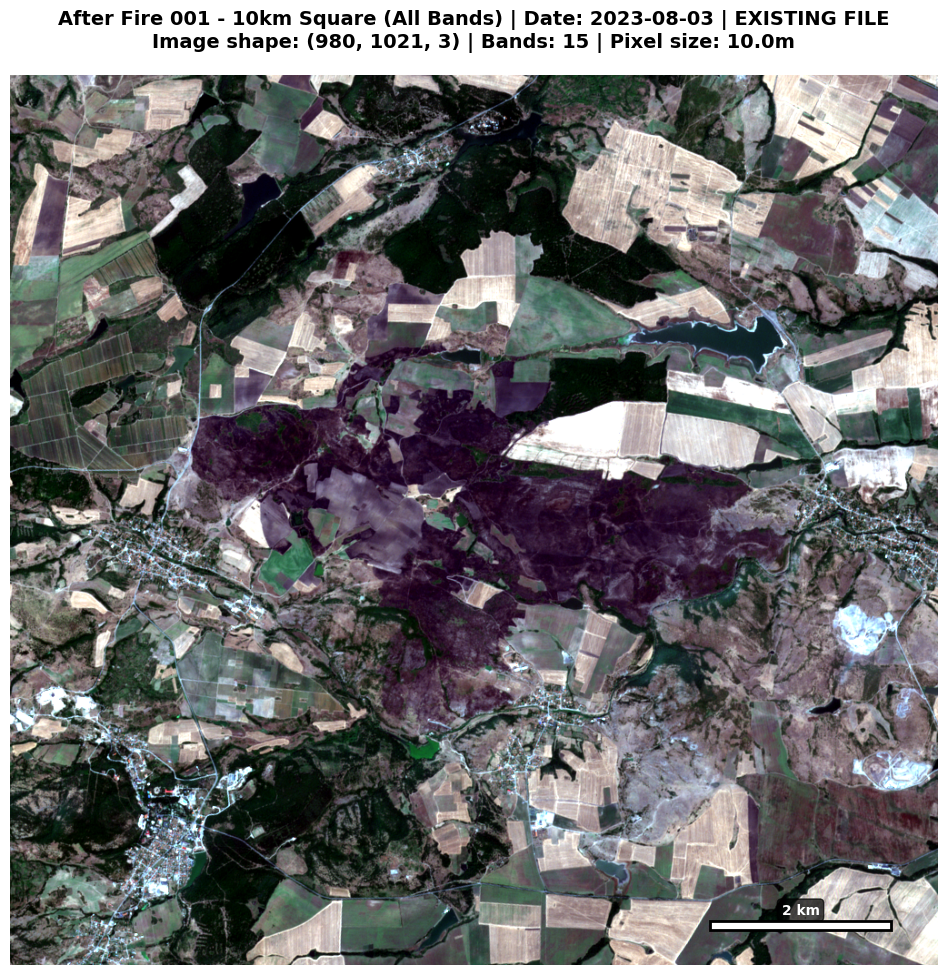

✅ Displayed RGB from: square_10km_allbands_after_001_20230803.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (980, 1021, 3)
   Pixel size: 10.00 m

Processing Fire Location 002

📤 Processing BEFORE image: preview_before_002_20231015.json
  📥 File not found, downloading: square_10km_allbands_before_002_20231015.tif
Searching for STAC item: S2A_MSIL2A_20231015T092031_R093_T34TFN_20241103T140930
✅ Successfully fetched STAC item: S2A_MSIL2A_20231015T092031_R093_T34TFN_20241103T140930
Extracting 10km square with ALL bands from S2A_MSIL2A_20231015T092031_R093_T34TFN_20241103T140930...
  Fire coordinates: (42.912783, 23.085883)
  Available bands in STAC item: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP', 'visual', 'safe-manifest', 'granule-metadata', 'inspire-metadata', 'product-metadata', 'datastrip-metadata', 'tilejson', 'rendered_preview']
  Extracting 15 bands: ['AOT', 'B01', 'B02', 'B03',

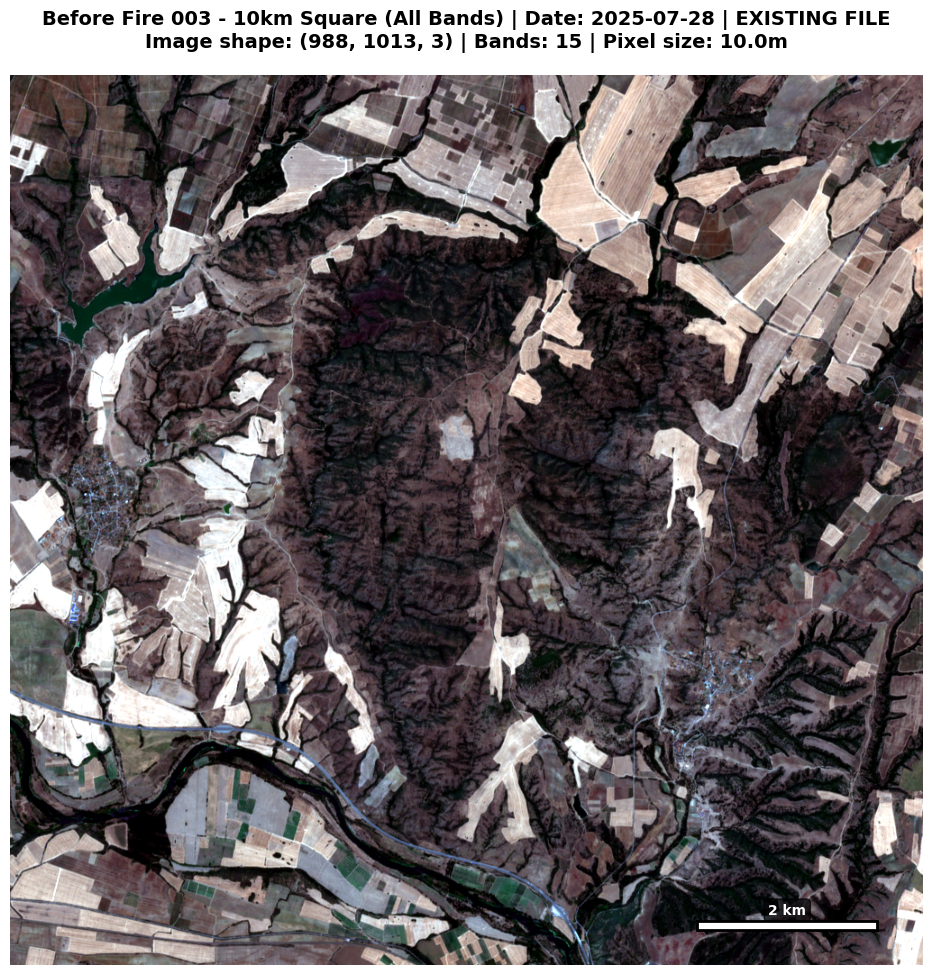

✅ Displayed RGB from: square_10km_allbands_before_003_20250728.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (988, 1013, 3)
   Pixel size: 10.00 m

📤 Processing AFTER image: preview_after_003_20250812.json
  📁 File already exists: square_10km_allbands_after_003_20250812.tif (14.8 MB)
  ✅ Valid file with 15 bands
  Image has 15 bands: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP']
  ✅ Added scale bar: 2 km


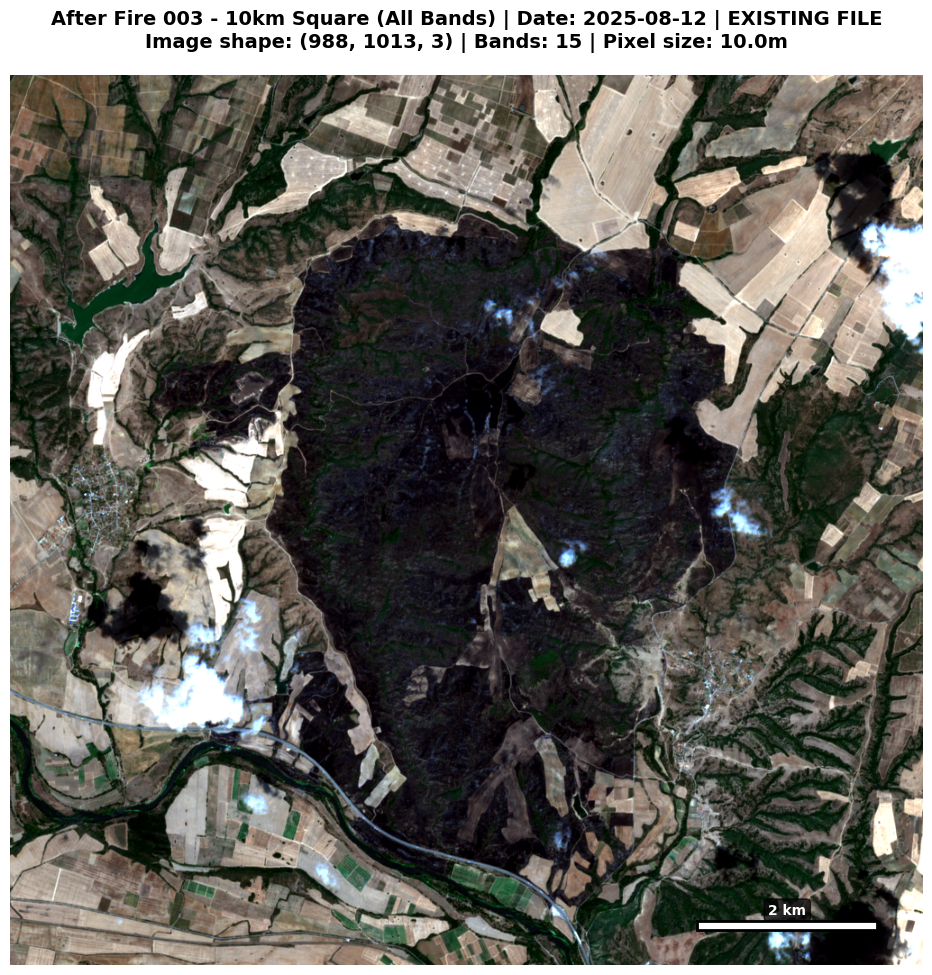

✅ Displayed RGB from: square_10km_allbands_after_003_20250812.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (988, 1013, 3)
   Pixel size: 10.00 m

Processing Fire Location 004

📤 Processing BEFORE image: preview_before_004_20250802.json
  📁 File already exists: square_10km_allbands_before_004_20250802.tif (14.8 MB)
  ✅ Valid file with 15 bands
  Image has 15 bands: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP']
  ✅ Added scale bar: 2 km


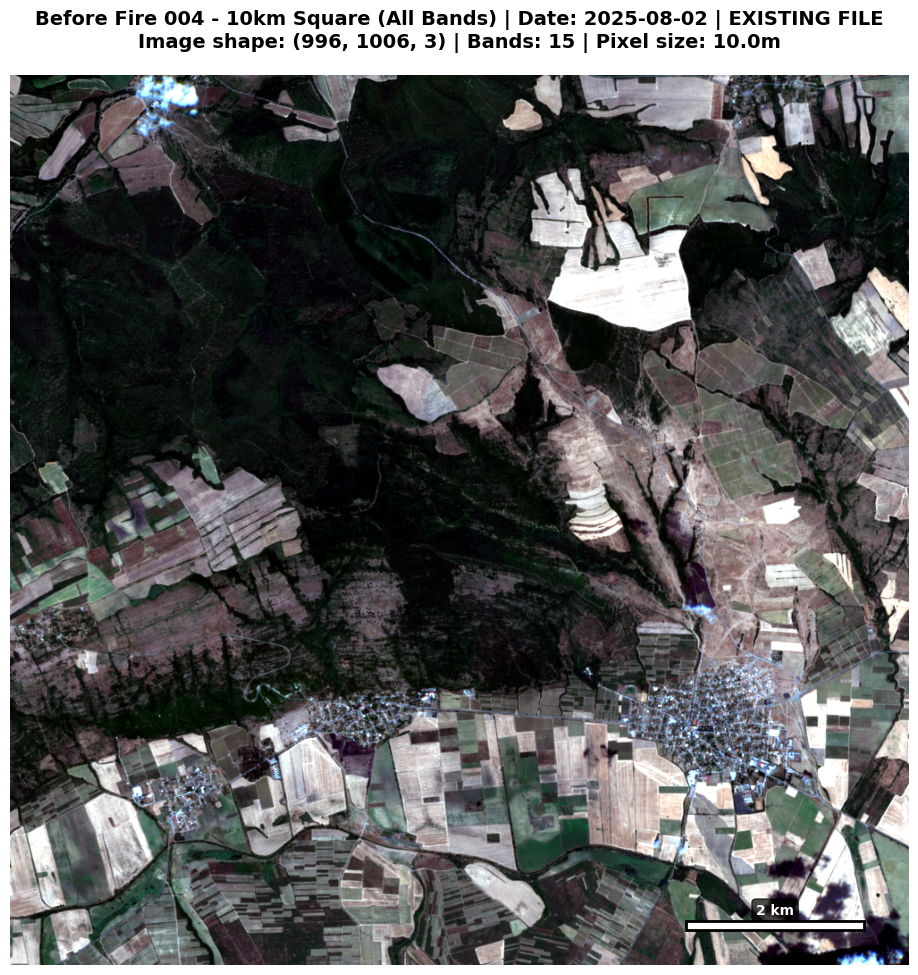

✅ Displayed RGB from: square_10km_allbands_before_004_20250802.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (996, 1006, 3)
   Pixel size: 10.00 m

📤 Processing AFTER image: preview_after_004_20250814.json
  📁 File already exists: square_10km_allbands_after_004_20250814.tif (14.8 MB)
  ✅ Valid file with 15 bands
  Image has 15 bands: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP']
  ✅ Added scale bar: 2 km


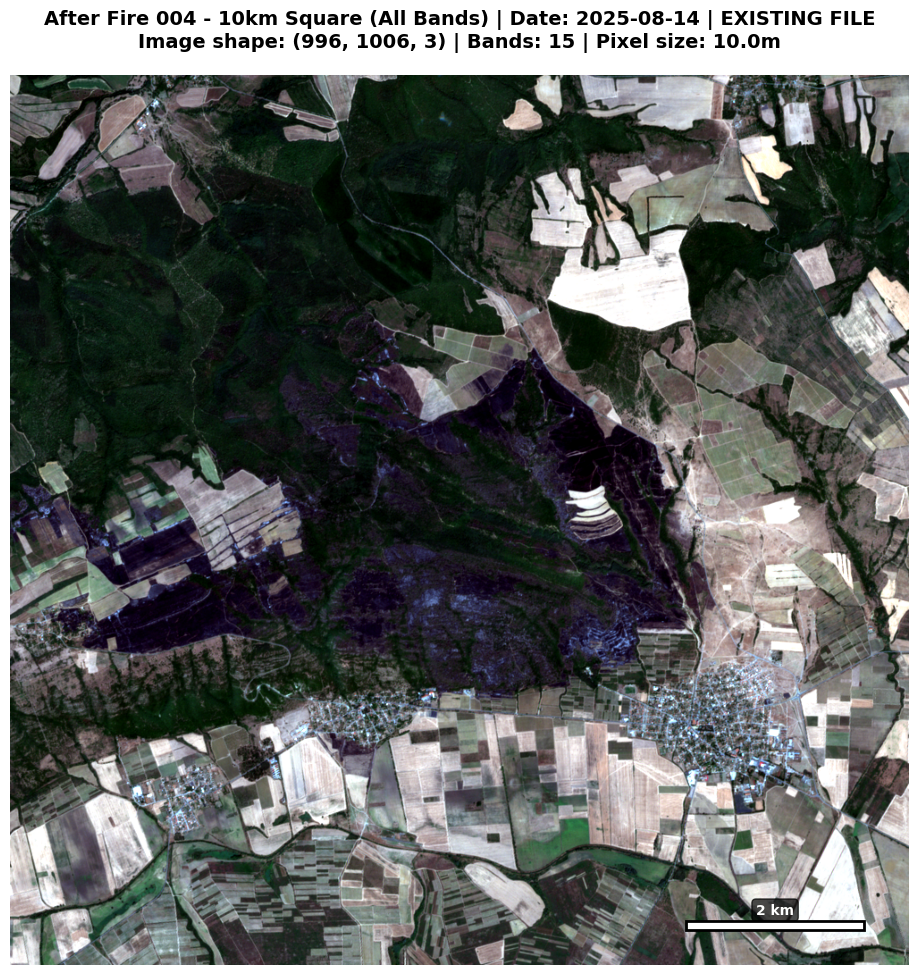

✅ Displayed RGB from: square_10km_allbands_after_004_20250814.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (996, 1006, 3)
   Pixel size: 10.00 m

Processing Fire Location 005

📤 Processing BEFORE image: preview_before_005_20250901.json
  📁 File already exists: square_10km_allbands_before_005_20250901.tif (14.8 MB)
  ✅ Valid file with 15 bands
  Image has 15 bands: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP']
  ✅ Added scale bar: 2 km


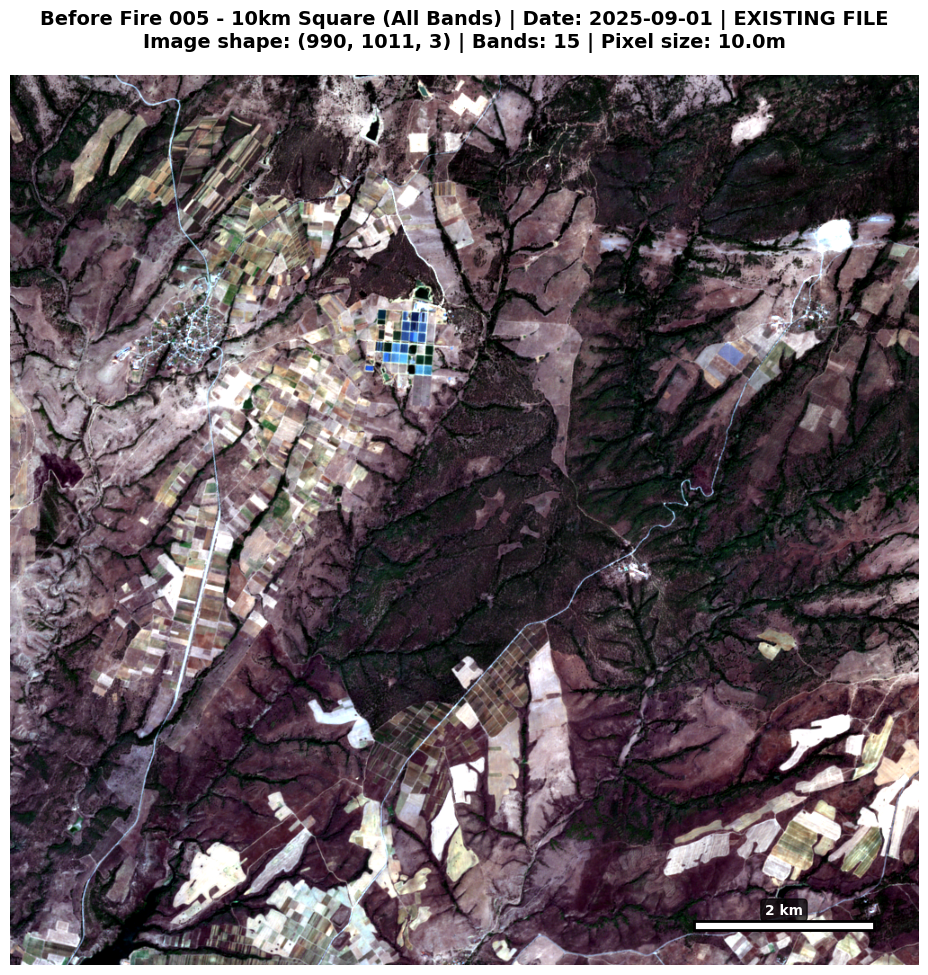

✅ Displayed RGB from: square_10km_allbands_before_005_20250901.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (990, 1011, 3)
   Pixel size: 10.00 m

📤 Processing AFTER image: preview_after_005_20250916.json
  📥 File not found, downloading: square_10km_allbands_after_005_20250916.tif
Searching for STAC item: S2B_MSIL2A_20250916T090549_R050_T35TMG_20250916T120416
✅ Successfully fetched STAC item: S2B_MSIL2A_20250916T090549_R050_T35TMG_20250916T120416
Extracting 10km square with ALL bands from S2B_MSIL2A_20250916T090549_R050_T35TMG_20250916T120416...
  Fire coordinates: (41.921013, 26.270351)
  Available bands in STAC item: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B11', 'B12', 'B8A', 'SCL', 'WVP', 'visual', 'safe-manifest', 'granule-metadata', 'inspire-metadata', 'product-metadata', 'datastrip-metadata', 'tilejson', 'rendered_preview']
  Extracting 15 bands: ['AOT', 'B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B0

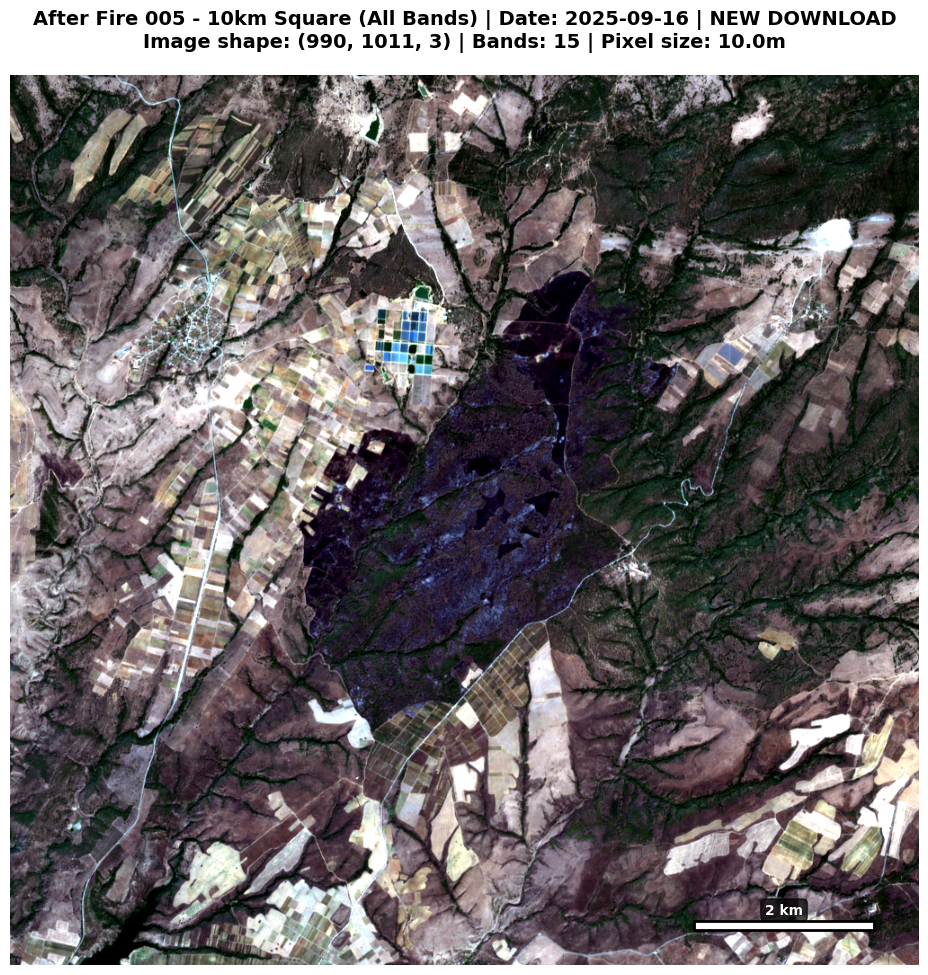

✅ Displayed RGB from: square_10km_allbands_after_005_20250916.tif
   Total bands: 15
   RGB bands: B04 (Red), B03 (Green), B02 (Blue)
   Image shape: (990, 1011, 3)
   Pixel size: 10.00 m

PROCESSING COMPLETED!
Output directory: C:\Users\steph\Downloads\master_thesis\scripts\sentinel2_fire_images\preview

Total 8 10km square files with all bands:
  📁 EXISTING - square_10km_allbands_after_001_20230803.tif (15 bands, 14.8 MB)
  📁 EXISTING - square_10km_allbands_after_003_20250812.tif (15 bands, 14.8 MB)
  📁 EXISTING - square_10km_allbands_after_004_20250814.tif (15 bands, 14.8 MB)
  📁 EXISTING - square_10km_allbands_after_005_20250916.tif (15 bands, 14.8 MB)
  📁 EXISTING - square_10km_allbands_before_001_20230719.tif (15 bands, 14.9 MB)
  📁 EXISTING - square_10km_allbands_before_003_20250728.tif (15 bands, 14.9 MB)
  📁 EXISTING - square_10km_allbands_before_004_20250802.tif (15 bands, 14.8 MB)
  📁 EXISTING - square_10km_allbands_before_005_20250901.tif (15 bands, 14.8 MB)

📊 SUMMARY:
  📁

In [9]:
import pystac_client
import planetary_computer
from odc.stac import stac_load
import yaml
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
import json
import os
from rasterio.transform import from_bounds
import rasterio
from rasterio.windows import Window
import math
from pyproj import Transformer
import pandas as pd

# Configuration - UPDATED PATH
PREVIEW_DIR = r'C:\Users\steph\Downloads\master_thesis\scripts\sentinel2_fire_images\preview'
SQUARE_SIZE_KM = 10

def create_square_bbox(lat: float, lon: float, size_km: float = SQUARE_SIZE_KM):
    """Return (min_lon, min_lat, max_lon, max_lat) for a square area with given side length."""
    R = 6371.0  # Earth radius (km)
    
    # Calculate latitude bounds
    lat_offset = (size_km / 2) / R * (180 / math.pi)
    min_lat = lat - lat_offset
    max_lat = lat + lat_offset
    
    # Calculate longitude bounds (accounts for latitude)
    lon_offset = (size_km / 2) / (R * math.cos(math.radians(lat))) * (180 / math.pi)
    min_lon = lon - lon_offset
    max_lon = lon + lon_offset
    
    return (min_lon, min_lat, max_lon, max_lat)

def get_stac_item_from_preview(preview_data):
    """Fetch the actual STAC item using pystac_client with proper authentication."""
    try:
        print(f"Searching for STAC item: {preview_data['item_id']}")
        
        # Open the catalog with the sign-in-place modifier
        catalog = pystac_client.Client.open(
            'https://planetarycomputer.microsoft.com/api/stac/v1',
            modifier=planetary_computer.sign_inplace
        )
        
        # Search for the specific item by ID within the sentinel-2-l2a collection
        search = catalog.search(
            collections=["sentinel-2-l2a"],
            ids=[preview_data['item_id']]
        )
        
        # Get the first item from the search results
        items = list(search.items())
        if items:
            item = items[0]
            print(f"✅ Successfully fetched STAC item: {item.id}")
            return item
        else:
            print(f"❌ STAC item not found: {preview_data['item_id']}")
            return None
            
    except Exception as e:
        print(f"❌ Error fetching STAC item: {e}")
        return None

def extract_date_from_preview(preview_data):
    """Extract and format date from preview data."""
    try:
        acquisition_date = preview_data['acquisition_date']
        # Format: 2025-09-01T09:06:11.025000+00:00 -> 2025-09-01
        date_part = acquisition_date.split('T')[0]
        # Format as YYYY-MM-DD
        year, month, day = date_part.split('-')
        return f"{year}-{month}-{day}"
    except:
        return "Unknown Date"

def get_fire_coordinates_from_preview(preview_data):
    """Extract fire coordinates from preview data."""
    try:
        center_coords = preview_data['center_coordinates']
        lat = center_coords['latitude']
        lon = center_coords['longitude']
        return (lat, lon)
    except:
        print("❌ Could not extract fire coordinates from preview data")
        return None

def add_scale_bar(ax, transform, scale_km=2):
    """Add a scale bar to the image using the raster transform."""
    try:
        # Get image dimensions in pixels
        y_pixels, x_pixels = ax.images[0].get_array().shape[:2]
        
        # Calculate pixel size in meters using the transform
        # Assuming transform gives meters per pixel (for UTM projections)
        pixel_size_x = transform.a  # meters per pixel in x direction
        pixel_size_y = -transform.e  # meters per pixel in y direction (negative in rasterio)
        
        # Use average pixel size
        pixel_size = (abs(pixel_size_x) + abs(pixel_size_y)) / 2
        
        # Calculate scale bar length in pixels
        scale_length_m = scale_km * 1000  # Convert km to meters
        scale_length_pixels = scale_length_m / pixel_size
        
        # Position in bottom right corner (5% from right, 5% from bottom)
        x_pos = x_pixels * 0.95 - scale_length_pixels
        y_pos = y_pixels * 0.95
        
        # Draw scale bar
        rect = Rectangle((x_pos, y_pos), scale_length_pixels, y_pixels * 0.01, 
                        facecolor='white', edgecolor='black', linewidth=2,
                        transform=ax.transData)
        ax.add_patch(rect)
        
        # Add scale text
        ax.text(x_pos + scale_length_pixels / 2, y_pos - y_pixels * 0.02, 
               f'{scale_km} km', 
               ha='center', va='top', color='white', fontweight='bold', fontsize=10,
               bbox=dict(boxstyle="round,pad=0.3", facecolor='black', alpha=0.7),
               transform=ax.transData)
        
        print(f"  ✅ Added scale bar: {scale_km} km")
        
    except Exception as e:
        print(f"  ⚠ Could not add scale bar: {e}")

def extract_and_save_all_bands(stac_item, output_path, image_type, date_str, fire_coords):
    """Extract and save a 10km square with ALL bands from the STAC item directly."""
    try:
        print(f"Extracting 10km square with ALL bands from {stac_item.id}...")
        print(f"  Fire coordinates: {fire_coords}")
        
        # Get all available bands from STAC item assets
        available_bands = list(stac_item.assets.keys())
        print(f"  Available bands in STAC item: {available_bands}")
        
        # Filter to common Sentinel-2 bands and remove metadata/assets we don't want
        sentinel_bands = [band for band in available_bands if band.startswith(('B', 'AOT', 'SCL', 'WVP')) and band not in ['visual', 'preview']]
        
        print(f"  Extracting {len(sentinel_bands)} bands: {sentinel_bands}")
        
        # Configuration for loading ALL Sentinel-2 data
        cfg = """
        sentinel-2-l2a:
          assets:
            "*":
              data_type: uint16
              nodata: 0
              unit: '1'
            "visual":
              data_type: uint8
              nodata: 0
              unit: '1'
            "AOT":
              data_type: uint16
              nodata: 0
              unit: '1'
            "WVP":
              data_type: uint16
              nodata: 0
              unit: '1'
            "SCL":
              data_type: uint8
              nodata: 0
              unit: '1'
        "*":
          warnings: ignore
        """
        cfg = yaml.safe_load(cfg)
        
        # Load ALL the bands data at their native resolutions
        ds = stac_load(
            [stac_item],
            bands=sentinel_bands,
            stac_cfg=cfg,
        )
        
        # Get the transform and CRS from the dataset
        transform, resolution_m = get_transform_from_dataset(ds)
        crs = ds.attrs.get('crs', 'EPSG:32635')  # Default to UTM zone 35N if not found
        
        print(f"  Dataset CRS: {crs}")
        print(f"  Dataset transform: {transform}")
        print(f"  Dataset shape: {ds.sizes}")
        
        # Calculate the bounding box for the 10km square
        center_lat, center_lon = fire_coords
        bbox = create_square_bbox(center_lat, center_lon)
        min_lon, min_lat, max_lon, max_lat = bbox
        
        print(f"  Geographic BBOX: {min_lon:.6f}, {min_lat:.6f}, {max_lon:.6f}, {max_lat:.6f}")
        
        # Transform geographic coordinates to pixel coordinates
        transformer = Transformer.from_crs("EPSG:4326", crs, always_xy=True)
        
        # Transform bounds to image CRS
        min_x, min_y = transformer.transform(min_lon, min_lat)
        max_x, max_y = transformer.transform(max_lon, max_lat)
        
        print(f"  Projected BBOX: {min_x:.2f}, {min_y:.2f}, {max_x:.2f}, {max_y:.2f}")
        
        # Get pixel coordinates using the transform
        # Note: transform * (col, row) = (x, y)
        # So to get (col, row) from (x, y): ~transform * (x, y)
        try:
            col_min, row_min = ~transform * (min_x, max_y)  # Top-left
            col_max, row_max = ~transform * (max_x, min_y)  # Bottom-right
        except Exception as e:
            print(f"  ⚠ Transform calculation failed: {e}")
            # Alternative method using rasterio's rowcol
            with rasterio.open(planetary_computer.sign(stac_item.assets['B02'].href)) as test_src:
                row_min, col_min = test_src.index(min_x, max_y)
                row_max, col_max = test_src.index(max_x, min_y)
        
        print(f"  Pixel coordinates before bounds check: col[{col_min:.2f}-{col_max:.2f}], row[{row_min:.2f}-{row_max:.2f}]")
        
        # Convert to integers and ensure within bounds
        col_min = max(0, int(min(col_min, col_max)))
        col_max = min(ds.sizes['x'], int(max(col_min, col_max)))
        row_min = max(0, int(min(row_min, row_max)))
        row_max = min(ds.sizes['y'], int(max(row_min, row_max)))
        
        # Calculate window size
        width = col_max - col_min
        height = row_max - row_min
        
        print(f"  Final window: col[{col_min}-{col_max}], row[{row_min}-{row_max}]")
        print(f"  Window size: {width} x {height} pixels")
        
        if width <= 0 or height <= 0:
            print(f"  ✗ Invalid window size: {width}x{height}")
            print(f"  Dataset dimensions: {ds.sizes['x']} x {ds.sizes['y']}")
            print(f"  Trying alternative extraction method...")
            
            # Alternative: Use a fixed size around the center point
            center_x, center_y = transformer.transform(center_lon, center_lat)
            center_col, center_row = ~transform * (center_x, center_y)
            
            # Use a fixed window size (approx 10km based on resolution)
            fixed_size = int(10000 / resolution_m)  # 10km in pixels
            
            col_min = max(0, int(center_col - fixed_size/2))
            col_max = min(ds.sizes['x'], int(center_col + fixed_size/2))
            row_min = max(0, int(center_row - fixed_size/2))
            row_max = min(ds.sizes['y'], int(center_row + fixed_size/2))
            
            width = col_max - col_min
            height = row_max - row_min
            
            print(f"  Fixed window around center: col[{col_min}-{col_max}], row[{row_min}-{row_max}]")
            print(f"  Fixed window size: {width} x {height} pixels")
            
            if width <= 0 or height <= 0:
                print(f"  ✗ Fixed window also invalid: {width}x{height}")
                return False
        
        # Extract the data using xarray indexing
        extracted_data = ds.isel(
            x=slice(col_min, col_max),
            y=slice(row_min, row_max)
        )
        
        # Prepare all bands data
        all_bands_data = []
        band_names = []
        
        for band in sentinel_bands:
            try:
                band_data = np.squeeze(extracted_data[band].values)
                
                # Handle different band resolutions by resampling if needed
                if band_data.shape != (height, width):
                    print(f"  ⚠ Band {band} has different shape {band_data.shape}, expected ({height}, {width})")
                    # Simple resampling - in practice you might want more sophisticated resampling
                    from scipy.ndimage import zoom
                    zoom_factors = (height / band_data.shape[0], width / band_data.shape[1])
                    band_data = zoom(band_data, zoom_factors, order=1)
                
                all_bands_data.append(band_data)
                band_names.append(band)
                print(f"  ✅ Band {band}: shape {band_data.shape}")
                
            except Exception as e:
                print(f"  ❌ Failed to extract band {band}: {e}")
        
        if not all_bands_data:
            print("  ✗ No bands successfully extracted")
            return False
        
        # Stack all bands
        all_bands_stack = np.stack(all_bands_data, axis=0)
        print(f"  Final stack shape: {all_bands_stack.shape}")
        
        # Calculate new transform for the extracted square
        new_transform = transform * rasterio.Affine.translation(col_min, row_min)
        
        # Create profile for output
        profile = {
            'driver': 'GTiff',
            'height': height,
            'width': width,
            'count': len(all_bands_data),
            'dtype': all_bands_stack.dtype,
            'crs': crs,
            'transform': new_transform,
            'compress': 'deflate'
        }
        
        # Write the extracted square with all bands
        with rasterio.open(output_path, 'w', **profile) as dst:
            dst.write(all_bands_stack)
            
            # Set band descriptions
            for i, band_name in enumerate(band_names, 1):
                dst.set_band_description(i, band_name)
        
        # Verify the file was created and has content
        file_size = os.path.getsize(output_path) / (1024 * 1024)  # Size in MB
        print(f"  ✅ Saved 10km {image_type} square with {len(all_bands_data)} bands: {os.path.basename(output_path)} ({file_size:.1f} MB)")
        print(f"     Size: {width} x {height} pixels")
        print(f"     Bands: {band_names}")
        print(f"     Center coordinates: ({center_lat:.5f}, {center_lon:.5f})")
        print(f"     Date: {date_str}")
        return True
        
    except Exception as e:
        print(f"  ❌ Error extracting 10km square with all bands: {e}")
        import traceback
        traceback.print_exc()
        return False

def get_transform_from_dataset(ds):
    """Extract transform and resolution from xarray dataset."""
    try:
        # Extract resolution from x and y coordinates
        x_res = float((ds.x[1] - ds.x[0]).values)
        y_res = float((ds.y[1] - ds.y[0]).values)
        
        # Create affine transform from the dataset bounds
        transform = from_bounds(
            float(ds.x[0].values),
            float(ds.y[-1].values),
            float(ds.x[-1].values),
            float(ds.y[0].values),
            len(ds.x),
            len(ds.y)
        )
        
        print(f"    Derived transform: {transform}")
        print(f"    Resolution: {abs(x_res):.2f} m")
        
        return transform, abs(x_res)
        
    except Exception as e:
        print(f"Error extracting transform from dataset: {e}")
        # Return a default transform for 10m resolution
        default_transform = rasterio.Affine(10, 0, 0, 0, -10, 0)
        print(f"    Using default transform: {default_transform}")
        return default_transform, 10

def display_rgb_from_all_bands(image_path, title):
    """Display RGB image from the all-bands GeoTIFF with scale bar."""
    try:
        with rasterio.open(image_path) as src:
            # Get band information
            band_count = src.count
            band_descriptions = [src.descriptions[i] if src.descriptions else f"Band_{i+1}" 
                               for i in range(band_count)]
            
            print(f"  Image has {band_count} bands: {band_descriptions}")
            
            # Find RGB bands
            red_band = None
            green_band = None
            blue_band = None
            
            for i, desc in enumerate(band_descriptions):
                if desc == 'B04':
                    red_band = i + 1
                elif desc == 'B03':
                    green_band = i + 1
                elif desc == 'B02':
                    blue_band = i + 1
            
            if red_band and green_band and blue_band:
                # Read RGB bands
                red = src.read(red_band)
                green = src.read(green_band)
                blue = src.read(blue_band)
                
                # Stack bands to create RGB image
                rgb = np.dstack((red, green, blue))
                
                # Apply contrast stretching
                def stretch_band(band):
                    p2, p98 = np.percentile(band, (2, 98))
                    if p98 - p2 > 0:
                        return np.clip((band - p2) / (p98 - p2), 0, 1)
                    else:
                        return band.astype(np.float32)
                
                rgb_stretched = np.zeros_like(rgb, dtype=np.float32)
                for i in range(3):
                    rgb_stretched[:,:,i] = stretch_band(rgb[:,:,i])
                
                # Display the image
                fig, ax = plt.subplots(figsize=(12, 10))
                
                # Display the RGB image
                im = ax.imshow(rgb_stretched)
                
                # Add scale bar using the raster transform
                try:
                    add_scale_bar(ax, src.transform)
                except Exception as e:
                    print(f"  ⚠ Could not add scale bar: {e}")
                
                # Enhanced title with more info
                full_title = f"{title}\n"
                full_title += f"Image shape: {rgb.shape} | Bands: {band_count} | Pixel size: {src.transform.a:.1f}m"
                
                plt.title(full_title, fontsize=14, fontweight='bold', pad=20)
                plt.axis('off')
                
                plt.subplots_adjust(left=0.01, right=0.99, top=0.90, bottom=0.01)
                plt.show()
                
                print(f"✅ Displayed RGB from: {os.path.basename(image_path)}")
                print(f"   Total bands: {band_count}")
                print(f"   RGB bands: B04 (Red), B03 (Green), B02 (Blue)")
                print(f"   Image shape: {rgb.shape}")
                print(f"   Pixel size: {src.transform.a:.2f} m")
                
            else:
                print(f"❌ Could not find RGB bands in the image")
                
    except Exception as e:
        print(f"❌ Error displaying image: {e}")

def check_and_process_image(preview_data, fire_id, image_type, fire_coords):
    """Check if image already exists, if not download it, then display it."""
    try:
        date_str = extract_date_from_preview(preview_data)
        output_filename = f'square_10km_allbands_{image_type}_{fire_id}_{date_str.replace("-", "")}.tif'
        output_path = os.path.join(PREVIEW_DIR, output_filename)
        
        # Check if file already exists
        if os.path.exists(output_path):
            file_size = os.path.getsize(output_path) / (1024 * 1024)  # Size in MB
            print(f"  📁 File already exists: {output_filename} ({file_size:.1f} MB)")
            
            # Verify the file is valid by checking band count
            try:
                with rasterio.open(output_path) as src:
                    band_count = src.count
                    print(f"  ✅ Valid file with {band_count} bands")
                
                # Display the existing file
                display_title = f"{image_type.capitalize()} Fire {fire_id} - 10km Square (All Bands) | Date: {date_str} | EXISTING FILE"
                display_rgb_from_all_bands(output_path, display_title)
                return True
                
            except Exception as e:
                print(f"  ⚠ File exists but is corrupted: {e}")
                print(f"  🔄 Re-downloading...")
                # File exists but is corrupted, so delete and re-download
                os.remove(output_path)
        
        # If file doesn't exist or was corrupted, download it
        print(f"  📥 File not found, downloading: {output_filename}")
        stac_item = get_stac_item_from_preview(preview_data)
        if stac_item:
            success = extract_and_save_all_bands(stac_item, output_path, image_type, date_str, fire_coords)
            if success:
                # Display the newly downloaded file
                display_title = f"{image_type.capitalize()} Fire {fire_id} - 10km Square (All Bands) | Date: {date_str} | NEW DOWNLOAD"
                display_rgb_from_all_bands(output_path, display_title)
                return True
            else:
                print(f"❌ Failed to extract 10km square with all bands from {image_type} image")
                return False
        else:
            print(f"❌ Failed to load {image_type} image STAC item")
            return False
            
    except Exception as e:
        print(f"❌ Error processing {image_type} image: {e}")
        return False

def main():
    print("Extracting 10km Squares from Sentinel-2 Images with ALL BANDS")
    print("=" * 70)
    print("CHECKING FOR EXISTING FILES - WILL ONLY DOWNLOAD IF NEEDED")
    print("=" * 70)
    
    # Find all preview files
    preview_files = [f for f in os.listdir(PREVIEW_DIR) if f.startswith('preview_') and f.endswith('.json')]
    
    if not preview_files:
        print(f"No preview files found in directory: {PREVIEW_DIR}")
        print("Please run the search script first to generate preview files.")
        return
    
    print(f"Found {len(preview_files)} preview files")
    
    # Group files by fire ID
    fire_files = {}
    for file in preview_files:
        # Extract fire ID from filename (e.g., preview_before_001_20250901.json -> 001)
        parts = file.split('_')
        if len(parts) >= 3:
            fire_id = parts[2]  # The number part
            if fire_id not in fire_files:
                fire_files[fire_id] = {'before': [], 'after': []}
            
            if 'before' in file:
                fire_files[fire_id]['before'].append(file)
            elif 'after' in file:
                fire_files[fire_id]['after'].append(file)
    
    print(f"Found {len(fire_files)} unique fire locations")
    
    # Process each fire location
    successful_extractions = []
    
    for fire_id, files in fire_files.items():
        print(f"\n{'='*50}")
        print(f"Processing Fire Location {fire_id}")
        print(f"{'='*50}")
        
        # Process before images
        if files['before']:
            before_file = sorted(files['before'])[0]  # Take the first before file
            print(f"\n📤 Processing BEFORE image: {before_file}")
            
            before_path = os.path.join(PREVIEW_DIR, before_file)
            with open(before_path, 'r') as f:
                before_preview = json.load(f)
            
            # Get fire coordinates from preview data
            fire_coords = get_fire_coordinates_from_preview(before_preview)
            if not fire_coords:
                print(f"❌ Skipping fire {fire_id} - could not extract coordinates")
                continue
                
            # Check if file exists and process accordingly
            success = check_and_process_image(before_preview, fire_id, "before", fire_coords)
            if success:
                successful_extractions.append(f"before_{fire_id}")
            else:
                print("❌ Failed to process before image")
        else:
            print("❌ No before image found for this fire location")
        
        # Process after images
        if files['after']:
            after_file = sorted(files['after'])[0]  # Take the first after file
            print(f"\n📤 Processing AFTER image: {after_file}")
            
            after_path = os.path.join(PREVIEW_DIR, after_file)
            with open(after_path, 'r') as f:
                after_preview = json.load(f)
            
            # Get fire coordinates from preview data (use before if available, otherwise use after)
            if not fire_coords:  # If we didn't get coords from before file
                fire_coords = get_fire_coordinates_from_preview(after_preview)
                if not fire_coords:
                    print(f"❌ Skipping fire {fire_id} - could not extract coordinates")
                    continue
            
            # Check if file exists and process accordingly
            success = check_and_process_image(after_preview, fire_id, "after", fire_coords)
            if success:
                successful_extractions.append(f"after_{fire_id}")
            else:
                print("❌ Failed to process after image")
        else:
            print("❌ No after image found for this fire location")
    
    print(f"\n{'=' * 70}")
    print("PROCESSING COMPLETED!")
    print(f"Output directory: {PREVIEW_DIR}")
    
    # List the created files with actual file sizes
    square_files = [f for f in os.listdir(PREVIEW_DIR) if f.startswith('square_10km_allbands_') and f.endswith('.tif')]
    print(f"\nTotal {len(square_files)} 10km square files with all bands:")
    
    existing_files = []
    new_files = []
    
    for file in sorted(square_files):
        file_path = os.path.join(PREVIEW_DIR, file)
        if os.path.exists(file_path):
            file_size = os.path.getsize(file_path) / (1024 * 1024)  # Size in MB
            # Get band count
            try:
                with rasterio.open(file_path) as src:
                    band_count = src.count
                    status = "🆕 NEW" if "NEW DOWNLOAD" in file else "📁 EXISTING"
                    print(f"  {status} - {file} ({band_count} bands, {file_size:.1f} MB)")
                    if "NEW DOWNLOAD" in file:
                        new_files.append(file)
                    else:
                        existing_files.append(file)
            except:
                print(f"  ⚠ CORRUPTED - {file} ({file_size:.1f} MB)")
        else:
            print(f"  ❌ MISSING - {file}")
    
    print(f"\n📊 SUMMARY:")
    print(f"  📁 Existing files: {len(existing_files)}")
    print(f"  🆕 New downloads: {len(new_files)}")
    print(f"  📊 Total processed: {len(square_files)}")

if __name__ == "__main__":
    main()